In [1]:
import pandas as pd
import numpy as np
import requests
from datetime import datetime, timedelta
from dateutil.relativedelta import relativedelta
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
from sklearn.metrics import r2_score
from sklearn.cluster import KMeans
import statsmodels.api as sm
from colorama import Fore, Style
from scipy.optimize import fsolve, curve_fit
import yfinance as yf
import akshare as ak
import sys
sys.path.append('../src') 
from utils import plot_candlestick, get_optimum_clusters, exponential_func

from chinese_etf_strategy import etf_strategy, etf_regression
from chinese_commodity_strategy import commodity_strategy

## Some sample code that're working

In [2]:
# Tongxin ETF, changnei, history
etf_code = "sh515880"  # ETF代码
etf_hist = ak.fund_etf_hist_sina(symbol=etf_code)
etf_hist.tail()

,date,open,high,low,close,volume
1437,2025-08-13,1.867,1.987,1.850,1.981,532398896
1438,2025-08-14,1.968,1.974,1.928,1.930,343308266
1439,2025-08-15,1.914,1.962,1.914,1.949,343655950
1440,2025-08-18,1.952,2.062,1.936,2.032,372588743
1441,2025-08-19,2.029,2.117,2.024,2.114,450253026


In [3]:
# Tongxin ETF, changnei, realtime
df = ak.fund_etf_spot_ths()
df[df['基金代码']=='515880']

,序号,基金代码,基金名称,当前-单位净值,当前-累计净值,前一日-单位净值,前一日-累计净值,增长值,增长率,赎回状态,申购状态,最新-交易日,最新-单位净值,最新-累计净值,基金类型,查询日期
0,1,515880,国泰中证全指通信设备ETF,2.1083,2.1083,2.0296,2.0296,0.0787,3.88,开放,开放,2025-08-19,2.1083,2.1083,股票型,2025-08-19


In [4]:
# Tongxin ETF, changnei, lishi and shishi
etf_code = "515880"  # ETF代码
start_date = (datetime.today() - relativedelta(years=3)).strftime('%Y%m%d')   # 开始日期
end_date = datetime.today().strftime('%Y%m%d')  # 结束日期

etf_hist = ak.fund_etf_hist_em(symbol=etf_code, period="daily", start_date=start_date, end_date=end_date, adjust="")
etf_hist.rename(columns={"日期": 'date', "开盘": 'open', "收盘": 'close', "最高": 'high', "最低": 'low', "成交量": 'volume', "成交额": 'amount'}, inplace=True)
etf_hist.tail()

  0%|          | 0/12 [00:00<?, ?it/s]

,date,open,close,high,low,volume,amount,振幅,涨跌幅,涨跌额,换手率
722,2025-08-13,1.867,1.981,1.987,1.850,5323989,1.036458e+09,7.36,6.45,0.120,20.03
723,2025-08-14,1.968,1.930,1.974,1.928,3433083,6.703063e+08,2.32,-2.57,-0.051,12.92
724,2025-08-15,1.914,1.949,1.962,1.914,3436560,6.671674e+08,2.49,0.98,0.019,12.93
725,2025-08-18,1.952,2.032,2.062,1.936,3725887,7.487094e+08,6.46,4.26,0.083,14.02
726,2025-08-19,2.029,2.114,2.117,2.024,4502530,9.401766e+08,4.58,4.04,0.082,16.94


In [5]:
# Huangjin, history
spot_hist_sge_df = ak.spot_hist_sge(symbol='Au99.99')
spot_hist_sge_df['date']= pd.to_datetime(spot_hist_sge_df['date'])
spot_hist_sge_df.tail()

,date,open,close,low,high
2099,2025-08-13,773.00,774.96,771.0,775.48
2100,2025-08-14,774.45,775.05,774.0,776.98
2101,2025-08-15,775.00,773.55,770.2,775.00
2102,2025-08-18,769.00,774.46,769.0,781.00
2103,2025-08-19,774.00,773.05,771.2,774.50


In [6]:
last_49day_price = spot_hist_sge_df['close'][-50:-1]
p_ma = np.mean(last_49day_price)
print('50MA break point:', round(p_ma,2))

50MA break point: 774.81


In [7]:
# Huangjin, realtime
spot_quotations_sge_df = ak.spot_quotations_sge(symbol="Au99.99")
spot_quotations_sge_df[spot_quotations_sge_df['时间'] == spot_quotations_sge_df['时间'].max()]

,品种,时间,现价,更新时间
253,Au99.99,10:42:00,768.05,2025年08月20日 10:42:59


In [8]:
spot_quotations_sge_df[spot_quotations_sge_df['时间'] == spot_quotations_sge_df['时间'].max()]['现价']

253    768.05
Name: 现价, dtype: float64

## ALL ETFs

* Current etf price: 0.79
* Recent high: 0.9
* Current etf price is at 88.18% of recent high
Latest 20 Day MA: 0.79
Latest lower Bollinger Band, 20MA: 0.77
Latest higher Bollinger Band, 20MA: 0.8
Latest 50 Day MA: 0.75
Latest lower Bollinger Band, 50MA: 0.68
Latest higher Bollinger Band, 50MA: 0.82
Latest 50 Day EMA: 0.76
Latest 120 Day MA: 0.73
Latest 200 Day MA: 0.74
Latest 200 Day EMA: 0.74

Latest RSI: 57.45 
Latest MACD Divergence: -0.0 
20MA break point: 0.78
20MA lower Bollinger Band break point: 0.76
20MA Upper Bollinger Band break point: 0.81
50MA break point: 0.75
50MA lower Bollinger Band break point: 0.68
50MA Upper Bollinger Band break point: 0.83
120MA break point: 0.73
200MA break point: 0.74


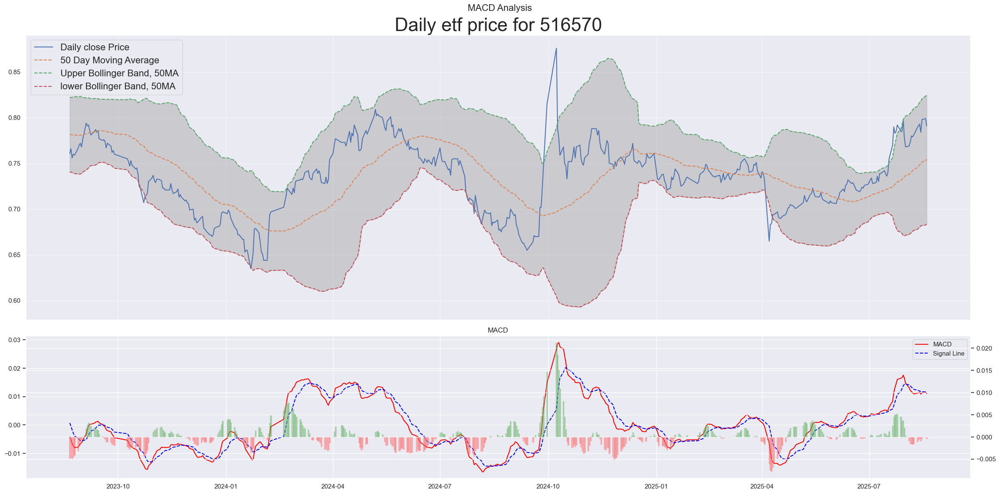

In [9]:
# 石油石化
etf_code = "516570"
etf_strategy(etf_code).output()

* Current etf price: 1.48
* Recent high: 1.6
* Current etf price is at 92.81% of recent high
Latest 20 Day MA: 1.51
Latest lower Bollinger Band, 20MA: 1.48
Latest higher Bollinger Band, 20MA: 1.54
Latest 50 Day MA: 1.52
Latest lower Bollinger Band, 50MA: 1.43
Latest higher Bollinger Band, 50MA: 1.6
Latest 50 Day EMA: 1.5
Latest 120 Day MA: 1.42
Latest 200 Day MA: 1.36
Latest 200 Day EMA: 1.37

Latest RSI: 47.58 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 1.81
20MA break point: 1.51
20MA lower Bollinger Band break point: 1.47
20MA Upper Bollinger Band break point: 1.55
50MA break point: 1.52
50MA lower Bollinger Band break point: 1.42
50MA Upper Bollinger Band break point: 1.61
120MA break point: 1.42
200MA break point: 1.36


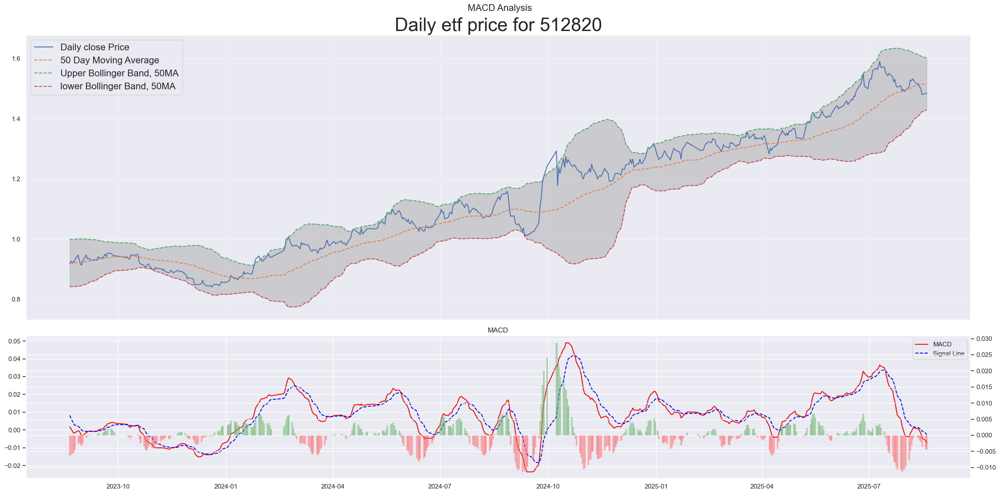

In [10]:
# 中证银行
etf_code = "512820"
etf_strategy(etf_code).output()

* Current etf price: 1.7
* Recent high: 1.76
* Current etf price is at 96.64% of recent high
Latest 20 Day MA: 1.66
Latest lower Bollinger Band, 20MA: 1.62
Latest higher Bollinger Band, 20MA: 1.7
Latest 50 Day MA: 1.6
Latest lower Bollinger Band, 50MA: 1.46
Latest higher Bollinger Band, 50MA: 1.74
Latest 50 Day EMA: 1.62
Latest 120 Day MA: 1.57
Latest 200 Day MA: 1.58
Latest 200 Day EMA: 1.56

Latest RSI: 63.13 
Latest MACD Divergence: 0.0 
20MA break point: 1.66
20MA lower Bollinger Band break point: 1.62
20MA Upper Bollinger Band break point: 1.71
50MA break point: 1.6
50MA lower Bollinger Band break point: 1.45
50MA Upper Bollinger Band break point: 1.75
120MA break point: 1.57
200MA break point: 1.58


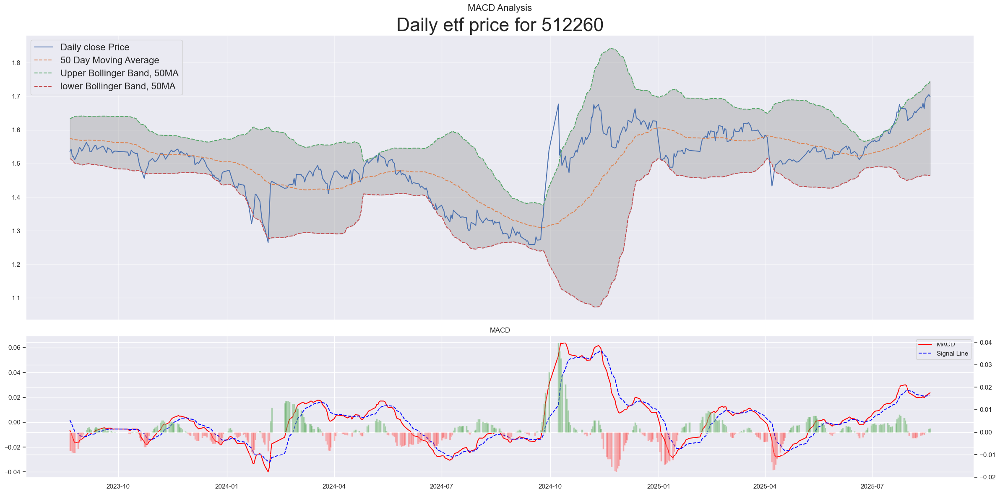

In [11]:
# 500低波
etf_code = "512260"
etf_strategy(etf_code).output()

* Current etf price: 1.16
* Recent high: 1.19
* Current etf price is at 97.72999999999999% of recent high
Latest 20 Day MA: 1.09
Latest lower Bollinger Band, 20MA: 1.02
Latest higher Bollinger Band, 20MA: 1.16
Latest 50 Day MA: 1.05
Latest lower Bollinger Band, 50MA: 0.94
Latest higher Bollinger Band, 50MA: 1.16
Latest 50 Day EMA: 1.07
Latest 120 Day MA: 1.05
Latest 200 Day MA: 1.04
Latest 200 Day EMA: 1.01

Latest RSI: 71.96 
Latest MACD Divergence: 0.01 
50MA crosses 200MA at 0.49
20MA break point: 1.09
20MA lower Bollinger Band break point: 1.02
20MA Upper Bollinger Band break point: 1.17
50MA break point: 1.05
50MA lower Bollinger Band break point: 0.93
50MA Upper Bollinger Band break point: 1.17
120MA break point: 1.05
200MA break point: 1.04


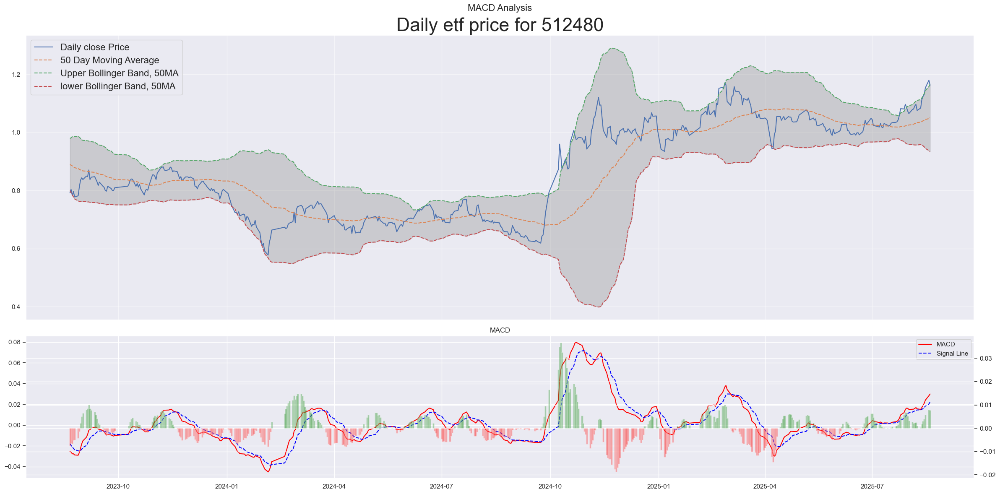

In [12]:
# 半导体
etf_code = "512480"
etf_strategy(etf_code).output()

* Current etf price: 1.02
* Recent high: 1.15
* Current etf price is at 88.73% of recent high
Latest 20 Day MA: 0.99
Latest lower Bollinger Band, 20MA: 0.96
Latest higher Bollinger Band, 20MA: 1.03
Latest 50 Day MA: 0.96
Latest lower Bollinger Band, 50MA: 0.87
Latest higher Bollinger Band, 50MA: 1.05
Latest 50 Day EMA: 0.97
Latest 120 Day MA: 0.94
Latest 200 Day MA: 0.97
Latest 200 Day EMA: 0.95

Latest RSI: 57.14 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.05
50MA crosses 200MA at 1.16
20MA break point: 0.99
20MA lower Bollinger Band break point: 0.95
20MA Upper Bollinger Band break point: 1.03
50MA break point: 0.96
50MA lower Bollinger Band break point: 0.87
50MA Upper Bollinger Band break point: 1.06
120MA break point: 0.94
200MA break point: 0.97


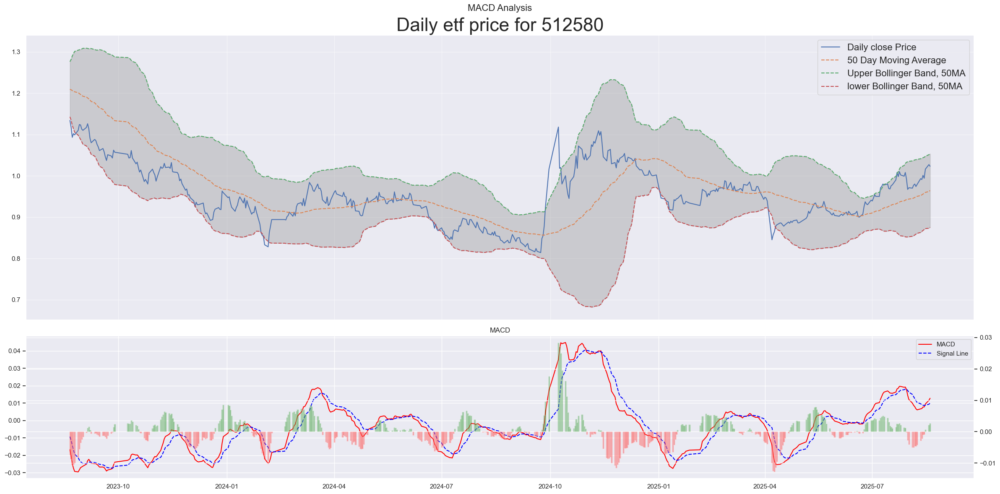

In [13]:
# 环保
etf_code = "512580"
etf_strategy(etf_code).output()

* Current etf price: 2.86
* Recent high: 3.02
* Current etf price is at 94.93% of recent high
Latest 20 Day MA: 2.63
Latest lower Bollinger Band, 20MA: 2.45
Latest higher Bollinger Band, 20MA: 2.81
Latest 50 Day MA: 2.46
Latest lower Bollinger Band, 50MA: 2.05
Latest higher Bollinger Band, 50MA: 2.87
Latest 50 Day EMA: 2.5
Latest 120 Day MA: 2.34
Latest 200 Day MA: 2.36
Latest 200 Day EMA: 2.32

Latest RSI: 72.28 
Latest MACD Divergence: 0.02 
20MA break point: 2.63
20MA lower Bollinger Band break point: 2.42
20MA Upper Bollinger Band break point: 2.84
50MA break point: 2.46
50MA lower Bollinger Band break point: 2.02
50MA Upper Bollinger Band break point: 2.91
120MA break point: 2.34
200MA break point: 2.36


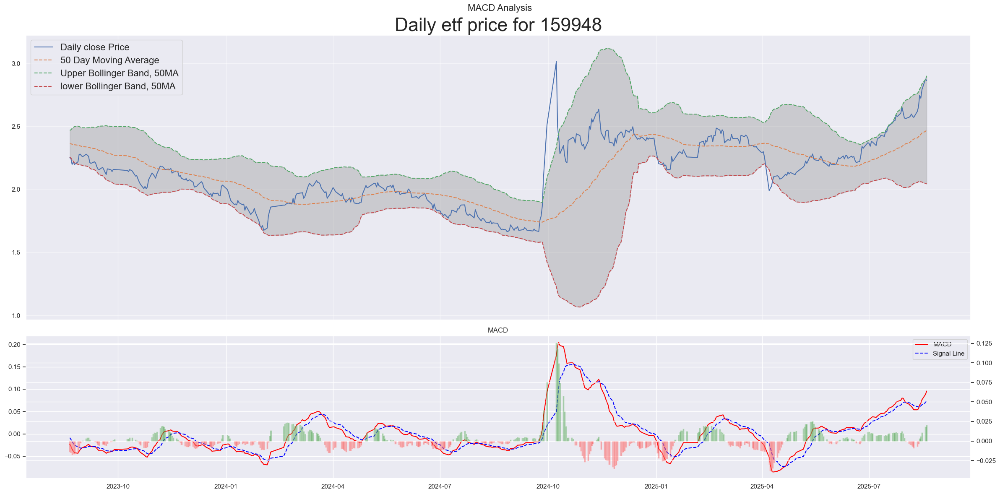

In [14]:
# 创业板
etf_code = "159948"
etf_strategy(etf_code).output()

* Current etf price: 0.99
* Recent high: 1.05
* Current etf price is at 93.83% of recent high
Latest 20 Day MA: 0.92
Latest lower Bollinger Band, 20MA: 0.86
Latest higher Bollinger Band, 20MA: 0.98
Latest 50 Day MA: 0.87
Latest lower Bollinger Band, 50MA: 0.75
Latest higher Bollinger Band, 50MA: 0.99
Latest 50 Day EMA: 0.89
Latest 120 Day MA: 0.88
Latest 200 Day MA: 0.85
Latest 200 Day EMA: 0.84

Latest RSI: 73.53 
Latest MACD Divergence: 0.0 
20MA break point: 0.92
20MA lower Bollinger Band break point: 0.85
20MA Upper Bollinger Band break point: 0.99
50MA break point: 0.87
50MA lower Bollinger Band break point: 0.74
50MA Upper Bollinger Band break point: 1.0
120MA break point: 0.88
200MA break point: 0.85


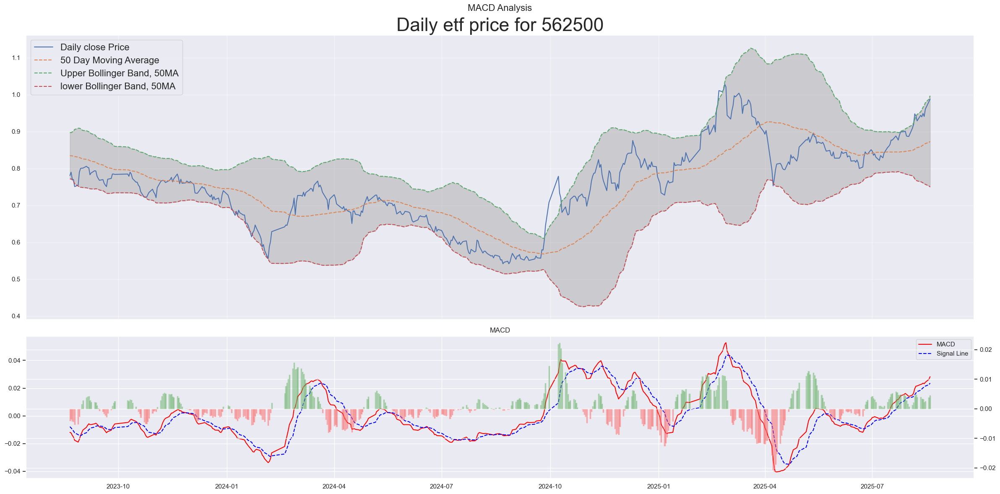

In [15]:
# 机器人
etf_code = "562500"
etf_strategy(etf_code).output()

* Current etf price: 1.2
* Recent high: 1.22
* Current etf price is at 98.61% of recent high
Latest 20 Day MA: 1.08
Latest lower Bollinger Band, 20MA: 0.98
Latest higher Bollinger Band, 20MA: 1.17
Latest 50 Day MA: 1.0
Latest lower Bollinger Band, 50MA: 0.82
Latest higher Bollinger Band, 50MA: 1.19
Latest 50 Day EMA: 1.03
Latest 120 Day MA: 0.97
Latest 200 Day MA: 0.95
Latest 200 Day EMA: 0.94

Latest RSI: 76.86 
Latest MACD Divergence: 0.01 
20MA break point: 1.08
20MA lower Bollinger Band break point: 0.97
20MA Upper Bollinger Band break point: 1.19
50MA break point: 1.0
50MA lower Bollinger Band break point: 0.8
50MA Upper Bollinger Band break point: 1.2
120MA break point: 0.97
200MA break point: 0.95


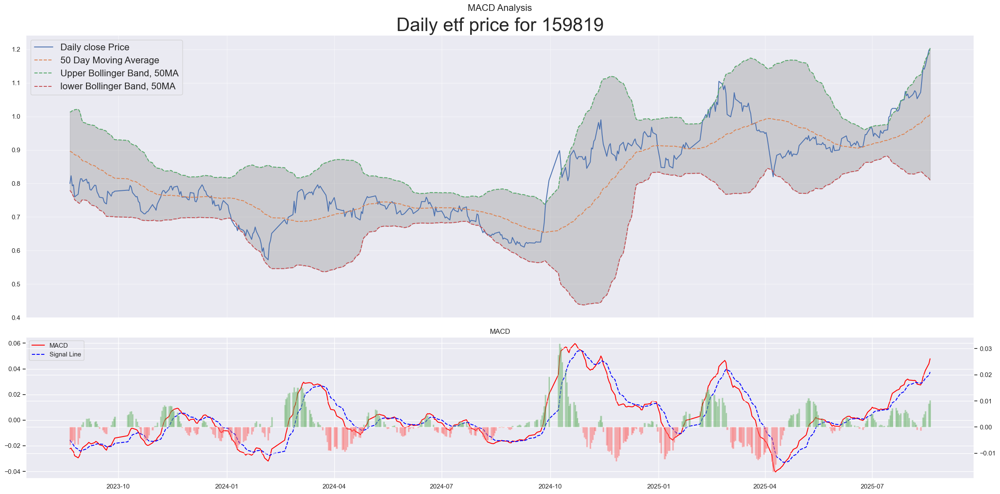

In [16]:
# 人工智能
etf_code = "159819"
etf_strategy(etf_code).output()

* Current etf price: 0.71
* Recent high: 1.01
* Current etf price is at 69.66% of recent high
Latest 20 Day MA: 0.7
Latest lower Bollinger Band, 20MA: 0.68
Latest higher Bollinger Band, 20MA: 0.71
Latest 50 Day MA: 0.69
Latest lower Bollinger Band, 50MA: 0.66
Latest higher Bollinger Band, 50MA: 0.72
Latest 50 Day EMA: 0.69
Latest 120 Day MA: 0.69
Latest 200 Day MA: 0.69
Latest 200 Day EMA: 0.69

Latest RSI: 57.14 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.37
50MA crosses 200MA at 1.0
20MA break point: 0.7
20MA lower Bollinger Band break point: 0.68
20MA Upper Bollinger Band break point: 0.71
50MA break point: 0.69
50MA lower Bollinger Band break point: 0.66
50MA Upper Bollinger Band break point: 0.72
120MA break point: 0.69
200MA break point: 0.69


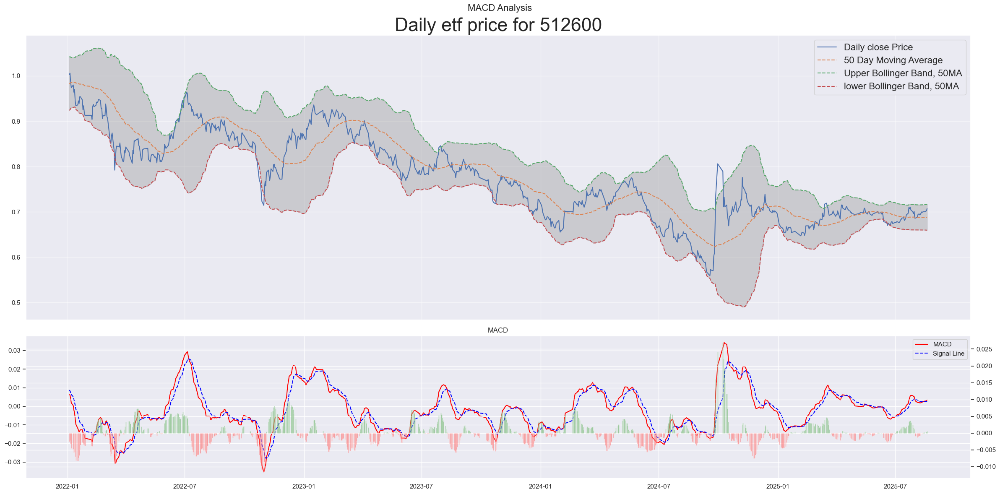

In [17]:
# 必选消费
etf_code = "512600"
etf_strategy(etf_code, start='20210101').output()

* Current etf price: 1.55
* Recent high: 1.56
* Current etf price is at 99.55000000000001% of recent high
Latest 20 Day MA: 1.47
Latest lower Bollinger Band, 20MA: 1.41
Latest higher Bollinger Band, 20MA: 1.53
Latest 50 Day MA: 1.42
Latest lower Bollinger Band, 50MA: 1.3
Latest higher Bollinger Band, 50MA: 1.54
Latest 50 Day EMA: 1.44
Latest 120 Day MA: 1.41
Latest 200 Day MA: 1.4
Latest 200 Day EMA: 1.38

Latest RSI: 76.65 
Latest MACD Divergence: 0.01 
50MA crosses 200MA at 0.14
20MA break point: 1.47
20MA lower Bollinger Band break point: 1.4
20MA Upper Bollinger Band break point: 1.54
50MA break point: 1.42
50MA lower Bollinger Band break point: 1.29
50MA Upper Bollinger Band break point: 1.56
120MA break point: 1.41
200MA break point: 1.41


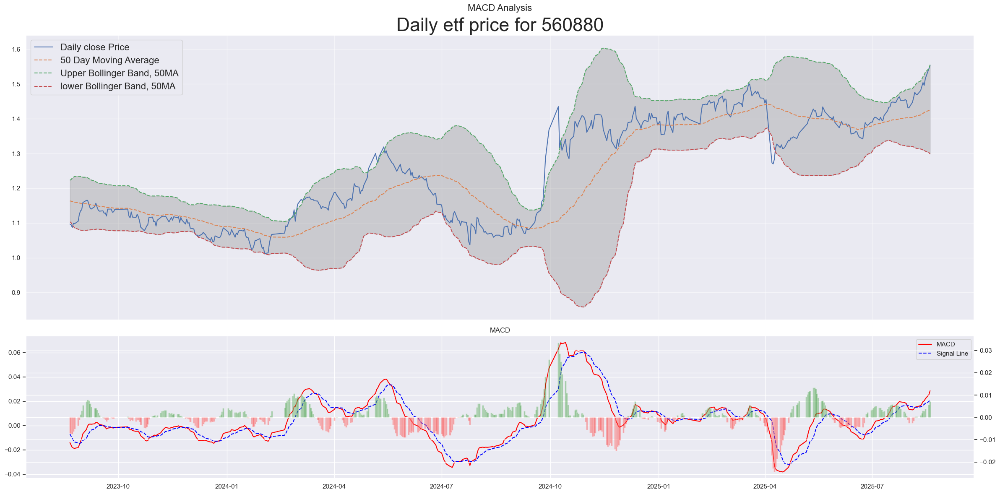

In [18]:
# 家电
etf_code = "560880"
etf_strategy(etf_code).output()

* Current etf price: 1.34
* Recent high: 1.37
* Current etf price is at 98.25% of recent high
Latest 20 Day MA: 1.28
Latest lower Bollinger Band, 20MA: 1.21
Latest higher Bollinger Band, 20MA: 1.35
Latest 50 Day MA: 1.19
Latest lower Bollinger Band, 50MA: 0.99
Latest higher Bollinger Band, 50MA: 1.39
Latest 50 Day EMA: 1.21
Latest 120 Day MA: 1.11
Latest 200 Day MA: 1.08
Latest 200 Day EMA: 1.1

Latest RSI: 67.46 
Latest MACD Divergence: 0.0 
20MA break point: 1.28
20MA lower Bollinger Band break point: 1.2
20MA Upper Bollinger Band break point: 1.37
50MA break point: 1.2
50MA lower Bollinger Band break point: 0.98
50MA Upper Bollinger Band break point: 1.41
120MA break point: 1.11
200MA break point: 1.08


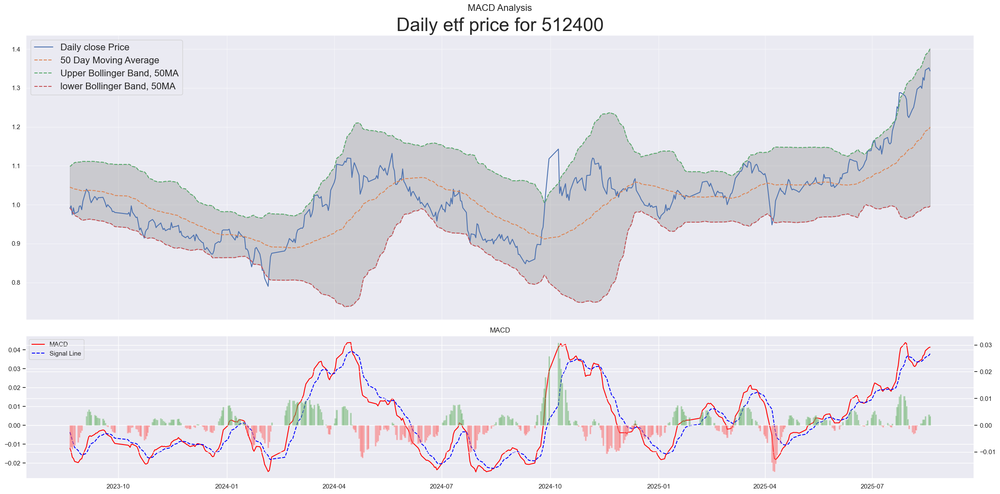

In [19]:
# 有色金属
etf_code = "512400"
etf_strategy(etf_code).output()

* Current etf price: 1.03
* Recent high: 1.2
* Current etf price is at 86.05000000000001% of recent high
Latest 20 Day MA: 1.03
Latest lower Bollinger Band, 20MA: 1.01
Latest higher Bollinger Band, 20MA: 1.05
Latest 50 Day MA: 1.02
Latest lower Bollinger Band, 50MA: 0.98
Latest higher Bollinger Band, 50MA: 1.06
Latest 50 Day EMA: 1.02
Latest 120 Day MA: 0.99
Latest 200 Day MA: 1.01
Latest 200 Day EMA: 1.0

Latest RSI: 54.64 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 0.69
50MA crosses 200MA at 0.05
20MA break point: 1.03
20MA lower Bollinger Band break point: 1.01
20MA Upper Bollinger Band break point: 1.05
50MA break point: 1.02
50MA lower Bollinger Band break point: 0.98
50MA Upper Bollinger Band break point: 1.06
120MA break point: 0.99
200MA break point: 1.01


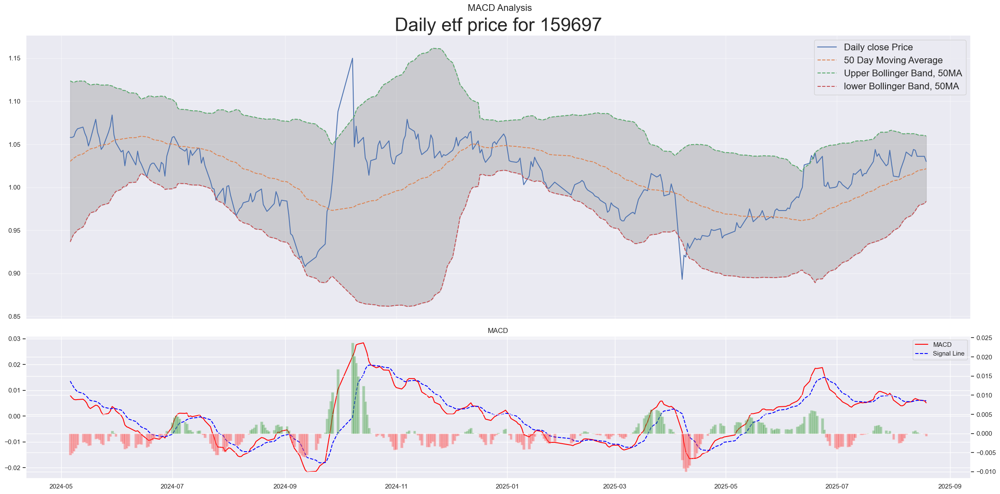

In [20]:
# 油气
etf_code = "159697"
etf_strategy(etf_code).output()

* Current etf price: 2.11
* Recent high: 2.12
* Current etf price is at 99.86% of recent high
Latest 20 Day MA: 1.77
Latest lower Bollinger Band, 20MA: 1.53
Latest higher Bollinger Band, 20MA: 2.02
Latest 50 Day MA: 1.57
Latest lower Bollinger Band, 50MA: 1.07
Latest higher Bollinger Band, 50MA: 2.07
Latest 50 Day EMA: 1.62
Latest 120 Day MA: 1.38
Latest 200 Day MA: 1.38
Latest 200 Day EMA: 1.39

Latest RSI: 81.97 
Latest MACD Divergence: 0.02 
20MA break point: 1.78
20MA lower Bollinger Band break point: 1.5
20MA Upper Bollinger Band break point: 2.06
50MA break point: 1.57
50MA lower Bollinger Band break point: 1.04
50MA Upper Bollinger Band break point: 2.11
120MA break point: 1.38
200MA break point: 1.38


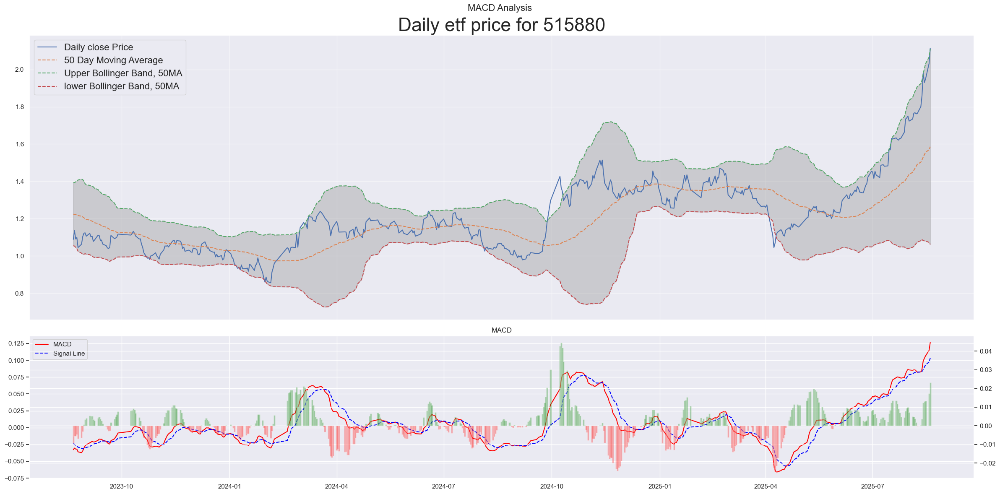

In [21]:
# 通信
etf_code = "515880"
etf_strategy(etf_code).output()

* Current etf price: 0.73
* Recent high: 0.75
* Current etf price is at 96.54% of recent high
Latest 20 Day MA: 0.71
Latest lower Bollinger Band, 20MA: 0.68
Latest higher Bollinger Band, 20MA: 0.75
Latest 50 Day MA: 0.67
Latest lower Bollinger Band, 50MA: 0.56
Latest higher Bollinger Band, 50MA: 0.78
Latest 50 Day EMA: 0.67
Latest 120 Day MA: 0.61
Latest 200 Day MA: 0.59
Latest 200 Day EMA: 0.6

Latest RSI: 51.72 
Latest MACD Divergence: -0.0 
20MA break point: 0.72
20MA lower Bollinger Band break point: 0.68
20MA Upper Bollinger Band break point: 0.75
50MA break point: 0.67
50MA lower Bollinger Band break point: 0.55
50MA Upper Bollinger Band break point: 0.79
120MA break point: 0.61
200MA break point: 0.59


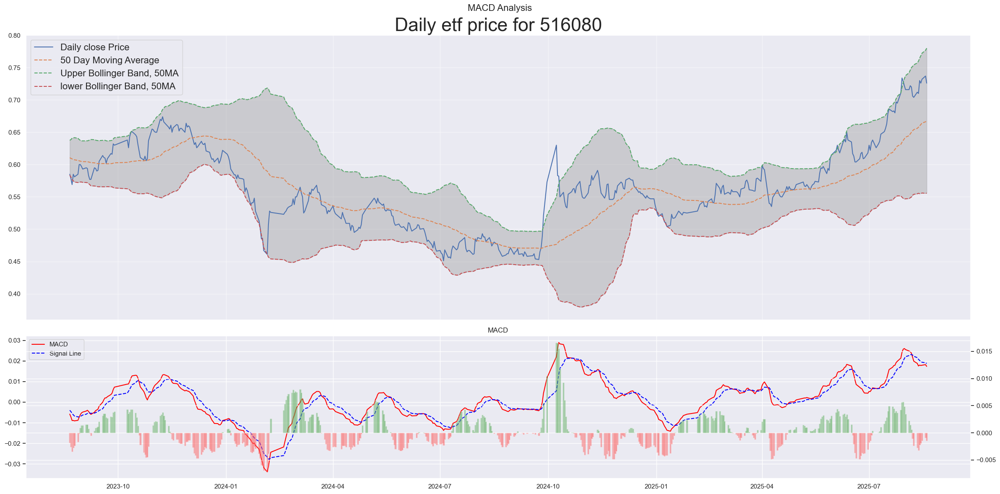

In [22]:
# 创新药
etf_code = "516080"
etf_strategy(etf_code).output()

* Current etf price: 1.06
* Recent high: 1.21
* Current etf price is at 87.97% of recent high
Latest 20 Day MA: 1.04
Latest lower Bollinger Band, 20MA: 1.01
Latest higher Bollinger Band, 20MA: 1.06
Latest 50 Day MA: 1.0
Latest lower Bollinger Band, 50MA: 0.93
Latest higher Bollinger Band, 50MA: 1.08
Latest 50 Day EMA: 1.01
Latest 120 Day MA: 0.98
Latest 200 Day MA: 0.99
Latest 200 Day EMA: 0.99

Latest RSI: 60.38 
Latest MACD Divergence: -0.0 
50MA crosses 200MA at 0.26
20MA break point: 1.04
20MA lower Bollinger Band break point: 1.01
20MA Upper Bollinger Band break point: 1.06
50MA break point: 1.01
50MA lower Bollinger Band break point: 0.93
50MA Upper Bollinger Band break point: 1.08
120MA break point: 0.98
200MA break point: 0.99


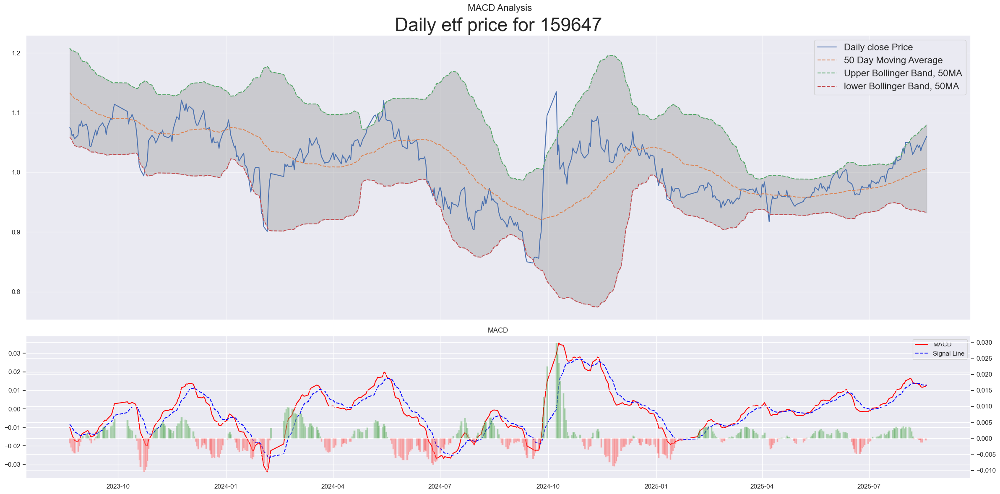

In [23]:
# 中药
etf_code = "159647"
etf_strategy(etf_code).output()

* Current etf price: 1.08
* Recent high: 1.4
* Current etf price is at 77.56% of recent high
Latest 20 Day MA: 1.09
Latest lower Bollinger Band, 20MA: 1.05
Latest higher Bollinger Band, 20MA: 1.13
Latest 50 Day MA: 1.04
Latest lower Bollinger Band, 50MA: 0.91
Latest higher Bollinger Band, 50MA: 1.16
Latest 50 Day EMA: 1.05
Latest 120 Day MA: 1.01
Latest 200 Day MA: 1.05
Latest 200 Day EMA: 1.05

Latest RSI: 47.92 
Latest MACD Divergence: -0.0 
50MA crosses 200MA at 2.09
20MA break point: 1.09
20MA lower Bollinger Band break point: 1.05
20MA Upper Bollinger Band break point: 1.14
50MA break point: 1.04
50MA lower Bollinger Band break point: 0.9
50MA Upper Bollinger Band break point: 1.17
120MA break point: 1.01
200MA break point: 1.05


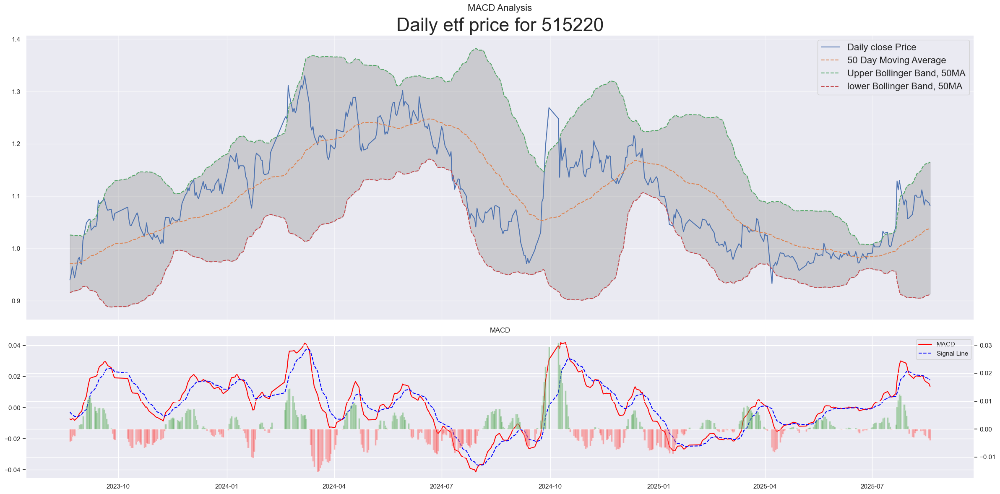

In [24]:
# 煤炭
etf_code = "515220"
etf_strategy(etf_code).output()

* Current etf price: 1.2
* Recent high: 1.24
* Current etf price is at 96.45% of recent high
Latest 20 Day MA: 1.2
Latest lower Bollinger Band, 20MA: 1.18
Latest higher Bollinger Band, 20MA: 1.22
Latest 50 Day MA: 1.2
Latest lower Bollinger Band, 50MA: 1.16
Latest higher Bollinger Band, 50MA: 1.24
Latest 50 Day EMA: 1.19
Latest 120 Day MA: 1.15
Latest 200 Day MA: 1.13
Latest 200 Day EMA: 1.13

Latest RSI: 56.06 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 1.23
20MA break point: 1.2
20MA lower Bollinger Band break point: 1.18
20MA Upper Bollinger Band break point: 1.22
50MA break point: 1.2
50MA lower Bollinger Band break point: 1.16
50MA Upper Bollinger Band break point: 1.24
120MA break point: 1.15
200MA break point: 1.13


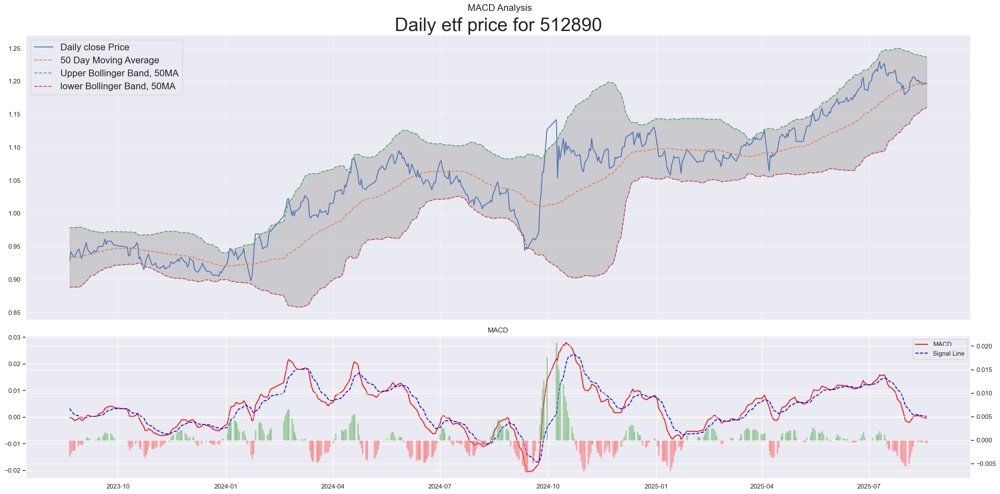

In [25]:
# 红利低波
etf_code = "512890"
etf_strategy(etf_code).output()

In [26]:
etf_code = "512890"
regression_start='20100101'
end=datetime.today().strftime('%Y%m%d')
detailed=False
adjust=""

df_etf = ak.fund_etf_hist_em(symbol=etf_code,
    	                   period="daily", 
                           start_date=regression_start,
                           end_date=end,
                           adjust=adjust)
df_etf.rename(columns={"日期": 'date', "开盘": 'open', "收盘": 'close', "最高": 'high', "最低": 'low', "成交量": 'volume', "成交额": 'amount'}, inplace=True)
df_etf['date'] = pd.to_datetime(df_etf['date'])
df_etf['max_price'] = df_etf['high'].cummax()
df_etf['drawdown'] = (df_etf['low'] - df_etf['max_price']) / df_etf['max_price']

max_drawdown_row = df_etf.loc[df_etf['drawdown'].idxmin()]
max_drawdown = max_drawdown_row['drawdown']

peak_date = df_etf.loc[:max_drawdown_row.name, 'high'].idxmax()
peak_price = round(df_etf.loc[peak_date, 'high'],2)
trough_date = max_drawdown_row['date']

df_etf = df_etf.reset_index()
df_etf['log_price'] = np.log(df_etf['close'])
df_etf

,index,date,open,close,high,low,volume,amount,振幅,涨跌幅,涨跌额,换手率,max_price,drawdown,log_price
0,0,2019-01-18,0.998,1.003,1.004,0.995,3244583,324300576.0,0.90,0.20,0.002,1.86,1.004,-0.008964,0.002996
1,1,2019-01-21,1.003,1.003,1.009,1.002,765523,77018053.0,0.70,0.00,0.000,0.44,1.009,-0.006938,0.002996
2,2,2019-01-22,1.004,1.000,1.006,0.999,150599,15106892.0,0.70,-0.30,-0.003,0.09,1.009,-0.009911,0.000000
3,3,2019-01-23,1.001,1.003,1.005,0.999,174368,17497300.0,0.60,0.30,0.003,0.10,1.009,-0.009911,0.002996
4,4,2019-01-24,1.004,1.006,1.008,1.002,310159,31218191.0,0.60,0.30,0.003,0.18,1.009,-0.006938,0.005982
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1591,1591,2025-08-13,1.203,1.198,1.206,1.196,3705458,444794467.0,0.83,-0.33,-0.004,2.13,1.798,-0.334816,0.180653
1592,1592,2025-08-14,1.197,1.199,1.207,1.196,3536393,425064254.0,0.92,0.08,0.001,2.03,1.798,-0.334816,0.181488
1593,1593,2025-08-15,1.199,1.195,1.200,1.185,4575554,544429137.0,1.25,-0.33,-0.004,2.63,1.798,-0.340934,0.178146
1594,1594,2025-08-18,1.193,1.197,1.201,1.191,5079024,607271527.0,0.84,0.17,0.002,2.91,1.798,-0.337597,0.179818


* Current etf price: 1.42
* Recent high: 1.56
* Current etf price is at 91.58% of recent high
Latest 20 Day MA: 1.44
Latest lower Bollinger Band, 20MA: 1.41
Latest higher Bollinger Band, 20MA: 1.46
Latest 50 Day MA: 1.41
Latest lower Bollinger Band, 50MA: 1.33
Latest higher Bollinger Band, 50MA: 1.48
Latest 50 Day EMA: 1.41
Latest 120 Day MA: 1.37
Latest 200 Day MA: 1.36
Latest 200 Day EMA: 1.36

Latest RSI: 48.08 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 0.59
20MA break point: 1.44
20MA lower Bollinger Band break point: 1.41
20MA Upper Bollinger Band break point: 1.46
50MA break point: 1.41
50MA lower Bollinger Band break point: 1.33
50MA Upper Bollinger Band break point: 1.49
120MA break point: 1.37
200MA break point: 1.36


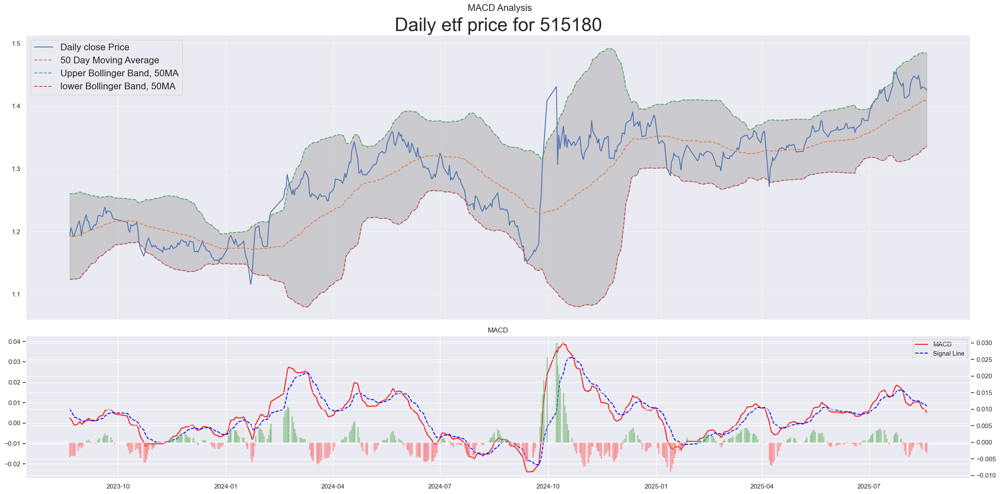

In [27]:
# 红利
etf_code = "515180"
etf_strategy(etf_code).output()

* Current commodity price: 257    765.6
Name: 现价, dtype: float64
* Recent high: 834.6
* Current commodity price is at 257    91.73
Name: 现价, dtype: float64% of recent high
Latest 20 Day MA: 775.48
Latest lower Bollinger Band, 20MA: 764.42
Latest higher Bollinger Band, 20MA: 786.53
Latest 50 Day MA: 774.77
Latest lower Bollinger Band, 50MA: 759.42
Latest higher Bollinger Band, 50MA: 790.12
Latest 50 Day EMA: 772.17
Latest 120 Day MA: 755.3
Latest 200 Day MA: 705.79
Latest 200 Day EMA: 712.72

Latest RSI: 59.56 
Latest MACD Divergence: -0.28 
20MA crosses 50MA at 761.91
20MA break point: 775.22
20MA lower Bollinger Band break point: 762.32
20MA Upper Bollinger Band break point: 788.12
50MA break point: 774.81
50MA lower Bollinger Band break point: 758.04
50MA Upper Bollinger Band break point: 791.59
120MA break point: 755.89
200MA break point: 706.21


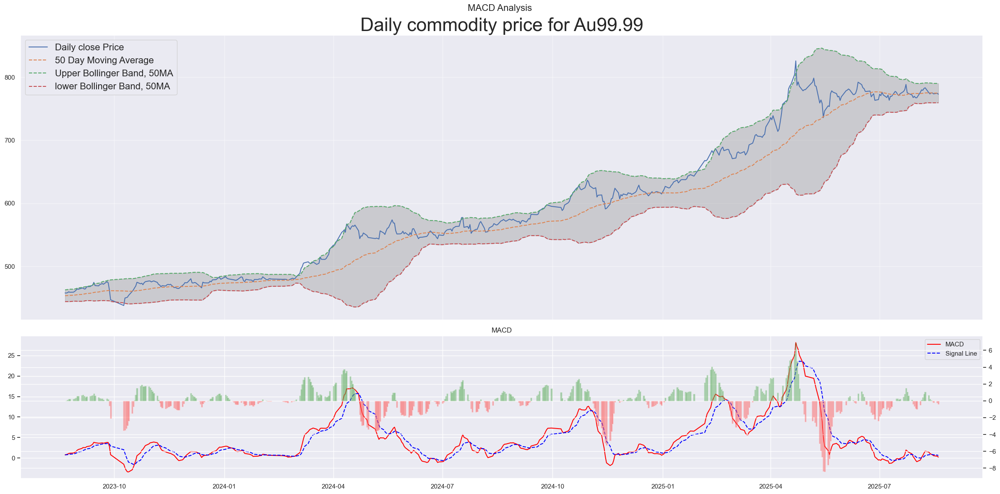

In [28]:
# 黄金
commodity_code = 'Au99.99'
commodity_strategy(commodity_code).output()

* Current etf price: 0.94
* Recent high: 0.95
* Current etf price is at 99.16% of recent high
Latest 20 Day MA: 0.9
Latest lower Bollinger Band, 20MA: 0.86
Latest higher Bollinger Band, 20MA: 0.93
Latest 50 Day MA: 0.87
Latest lower Bollinger Band, 50MA: 0.79
Latest higher Bollinger Band, 50MA: 0.94
Latest 50 Day EMA: 0.87
Latest 120 Day MA: 0.84
Latest 200 Day MA: 0.82
Latest 200 Day EMA: 0.81

Latest RSI: 76.7 
Latest MACD Divergence: 0.0 
20MA break point: 0.9
20MA lower Bollinger Band break point: 0.85
20MA Upper Bollinger Band break point: 0.94
50MA break point: 0.87
50MA lower Bollinger Band break point: 0.79
50MA Upper Bollinger Band break point: 0.95
120MA break point: 0.84
200MA break point: 0.82


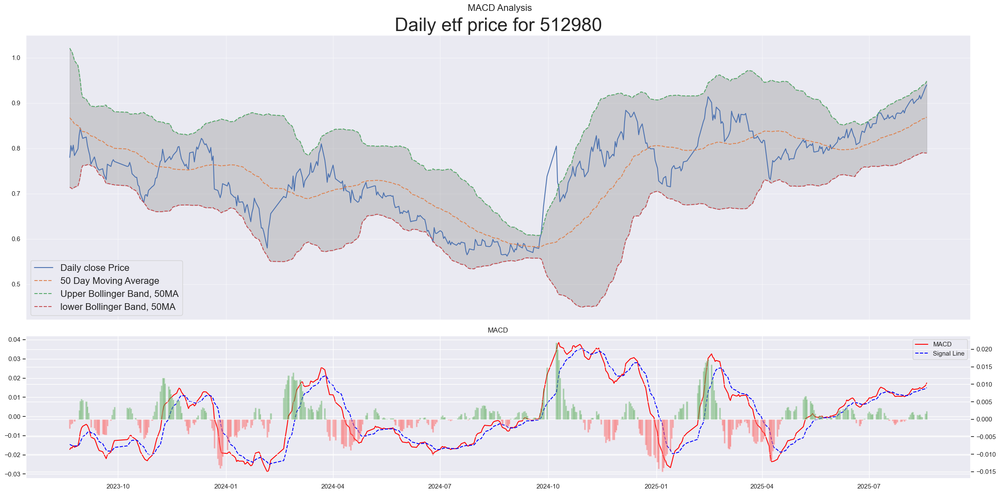

In [29]:
# 传媒
etf_code = "512980"
etf_strategy(etf_code).output()

* Current etf price: 1.31
* Recent high: 1.35
* Current etf price is at 97.11% of recent high
Latest 20 Day MA: 1.3
Latest lower Bollinger Band, 20MA: 1.27
Latest higher Bollinger Band, 20MA: 1.32
Latest 50 Day MA: 1.27
Latest lower Bollinger Band, 50MA: 1.18
Latest higher Bollinger Band, 50MA: 1.36
Latest 50 Day EMA: 1.27
Latest 120 Day MA: 1.2
Latest 200 Day MA: 1.18
Latest 200 Day EMA: 1.17

Latest RSI: 64.84 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.48
20MA break point: 1.3
20MA lower Bollinger Band break point: 1.27
20MA Upper Bollinger Band break point: 1.32
50MA break point: 1.27
50MA lower Bollinger Band break point: 1.18
50MA Upper Bollinger Band break point: 1.37
120MA break point: 1.2
200MA break point: 1.18


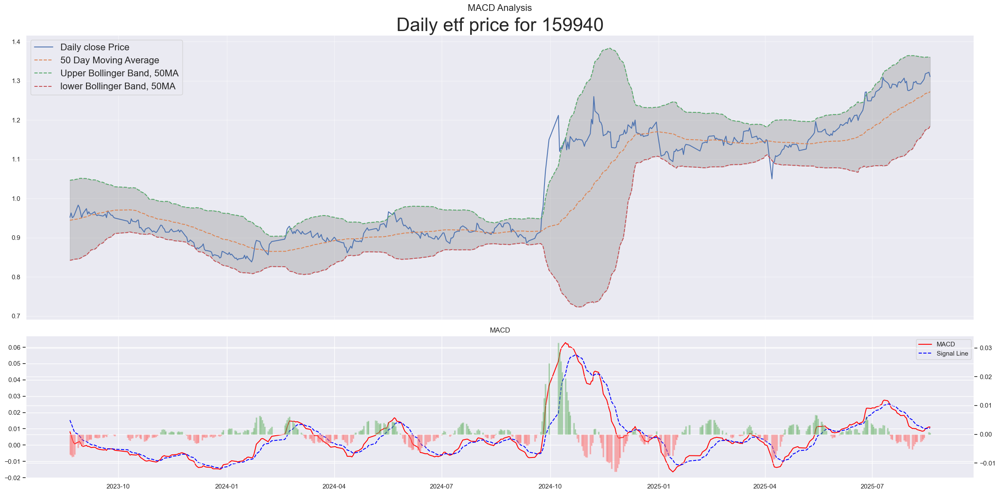

In [30]:
# 地产
etf_code = "159940"
etf_strategy(etf_code).output()

* Current etf price: 1.35
* Recent high: 1.42
* Current etf price is at 94.8% of recent high
Latest 20 Day MA: 1.31
Latest lower Bollinger Band, 20MA: 1.27
Latest higher Bollinger Band, 20MA: 1.34
Latest 50 Day MA: 1.29
Latest lower Bollinger Band, 50MA: 1.25
Latest higher Bollinger Band, 50MA: 1.34
Latest 50 Day EMA: 1.3
Latest 120 Day MA: 1.29
Latest 200 Day MA: 1.29
Latest 200 Day EMA: 1.26

Latest RSI: 60.49 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.92
50MA crosses 200MA at 0.7
20MA break point: 1.31
20MA lower Bollinger Band break point: 1.26
20MA Upper Bollinger Band break point: 1.35
50MA break point: 1.29
50MA lower Bollinger Band break point: 1.24
50MA Upper Bollinger Band break point: 1.35
120MA break point: 1.29
200MA break point: 1.29


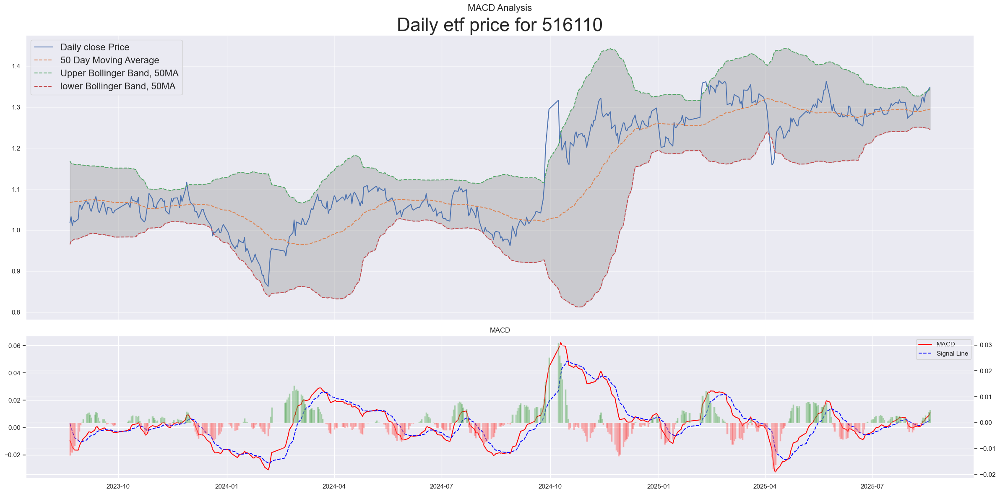

In [31]:
# 汽车
etf_code = "516110"
etf_strategy(etf_code).output()

* Current etf price: 1.44
* Recent high: 1.63
* Current etf price is at 88.51% of recent high
Latest 20 Day MA: 1.43
Latest lower Bollinger Band, 20MA: 1.39
Latest higher Bollinger Band, 20MA: 1.48
Latest 50 Day MA: 1.39
Latest lower Bollinger Band, 50MA: 1.29
Latest higher Bollinger Band, 50MA: 1.5
Latest 50 Day EMA: 1.4
Latest 120 Day MA: 1.4
Latest 200 Day MA: 1.32
Latest 200 Day EMA: 1.31

Latest RSI: 50.31 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 0.13
20MA break point: 1.43
20MA lower Bollinger Band break point: 1.38
20MA Upper Bollinger Band break point: 1.49
50MA break point: 1.39
50MA lower Bollinger Band break point: 1.28
50MA Upper Bollinger Band break point: 1.51
120MA break point: 1.4
200MA break point: 1.32


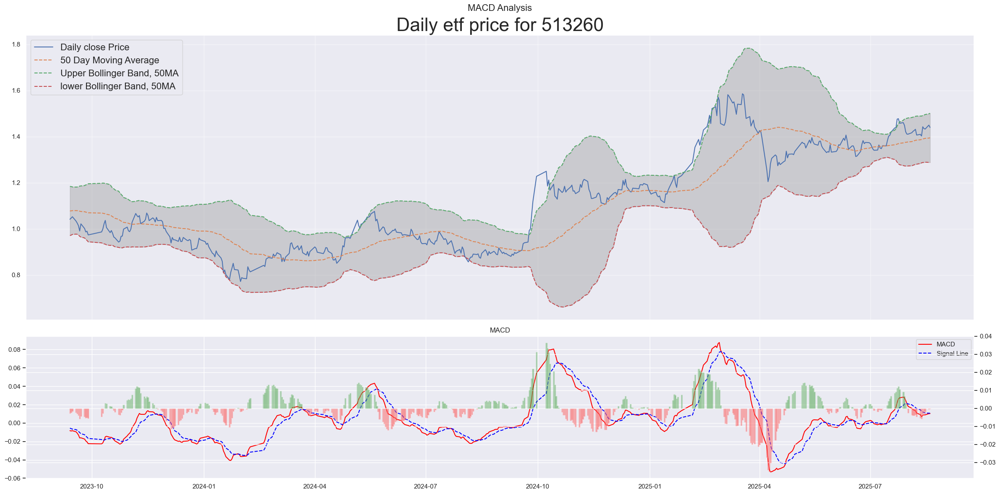

In [32]:
# 恒生科技
etf_code = "513260"
etf_strategy(etf_code).output()

* Current etf price: 0.72
* Recent high: 0.74
* Current etf price is at 97.03% of recent high
Latest 20 Day MA: 0.68
Latest lower Bollinger Band, 20MA: 0.64
Latest higher Bollinger Band, 20MA: 0.73
Latest 50 Day MA: 0.62
Latest lower Bollinger Band, 50MA: 0.48
Latest higher Bollinger Band, 50MA: 0.76
Latest 50 Day EMA: 0.63
Latest 120 Day MA: 0.54
Latest 200 Day MA: 0.48
Latest 200 Day EMA: 0.51

Latest RSI: 64.66 
Latest MACD Divergence: 0.0 
20MA break point: 0.68
20MA lower Bollinger Band break point: 0.63
20MA Upper Bollinger Band break point: 0.73
50MA break point: 0.62
50MA lower Bollinger Band break point: 0.47
50MA Upper Bollinger Band break point: 0.77
120MA break point: 0.54
200MA break point: 0.48


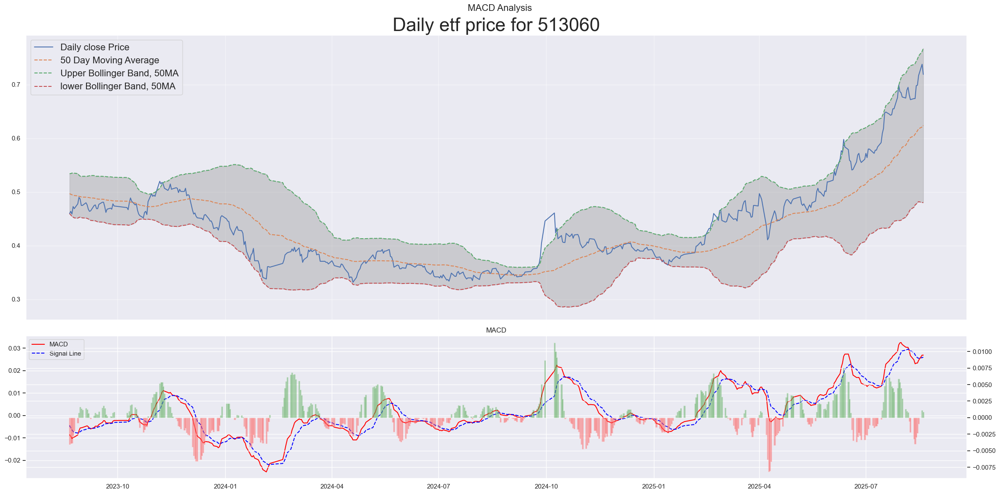

In [33]:
# 恒生医疗
etf_code = "513060"
etf_strategy(etf_code).output()

* Current etf price: 3.13
* Recent high: 3.19
* Current etf price is at 98.24000000000001% of recent high
Latest 20 Day MA: 3.11
Latest lower Bollinger Band, 20MA: 3.03
Latest higher Bollinger Band, 20MA: 3.18
Latest 50 Day MA: 3.02
Latest lower Bollinger Band, 50MA: 2.82
Latest higher Bollinger Band, 50MA: 3.23
Latest 50 Day EMA: 3.03
Latest 120 Day MA: 2.92
Latest 200 Day MA: 2.75
Latest 200 Day EMA: 2.77

Latest RSI: 50.99 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.31
20MA break point: 3.11
20MA lower Bollinger Band break point: 3.02
20MA Upper Bollinger Band break point: 3.2
50MA break point: 3.02
50MA lower Bollinger Band break point: 2.8
50MA Upper Bollinger Band break point: 3.25
120MA break point: 2.92
200MA break point: 2.75


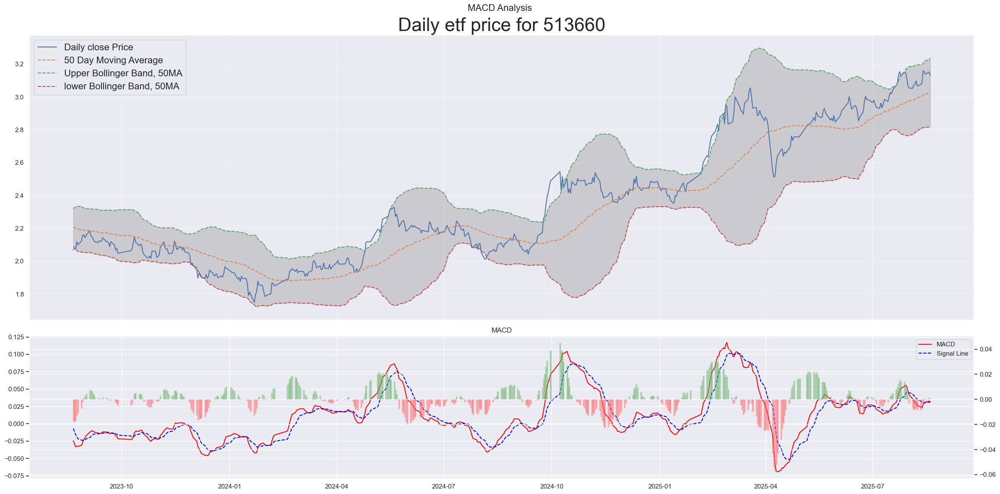

In [34]:
# 恒生
etf_code = "513660"
etf_strategy(etf_code).output()

* Current etf price: 1.44
* Recent high: 1.48
* Current etf price is at 97.3% of recent high
Latest 20 Day MA: 1.45
Latest lower Bollinger Band, 20MA: 1.43
Latest higher Bollinger Band, 20MA: 1.48
Latest 50 Day MA: 1.41
Latest lower Bollinger Band, 50MA: 1.3
Latest higher Bollinger Band, 50MA: 1.52
Latest 50 Day EMA: 1.41
Latest 120 Day MA: 1.31
Latest 200 Day MA: 1.25
Latest 200 Day EMA: 1.26

Latest RSI: 43.33 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 0.01
20MA break point: 1.45
20MA lower Bollinger Band break point: 1.42
20MA Upper Bollinger Band break point: 1.48
50MA break point: 1.41
50MA lower Bollinger Band break point: 1.29
50MA Upper Bollinger Band break point: 1.53
120MA break point: 1.31
200MA break point: 1.25


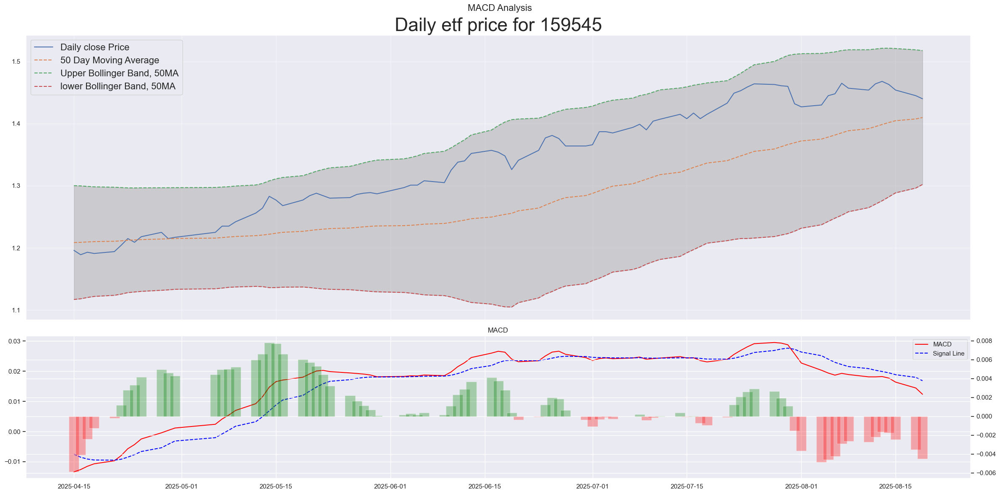

In [35]:
# 恒生红利低波
etf_code = "159545"
etf_strategy(etf_code).output()

* Current etf price: 2.94
* Recent high: 3.15
* Current etf price is at 93.39% of recent high
Latest 20 Day MA: 2.92
Latest lower Bollinger Band, 20MA: 2.88
Latest higher Bollinger Band, 20MA: 2.97
Latest 50 Day MA: 2.86
Latest lower Bollinger Band, 50MA: 2.68
Latest higher Bollinger Band, 50MA: 3.03
Latest 50 Day EMA: 2.87
Latest 120 Day MA: 2.78
Latest 200 Day MA: 2.75
Latest 200 Day EMA: 2.74

Latest RSI: 59.59 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.74
20MA break point: 2.93
20MA lower Bollinger Band break point: 2.87
20MA Upper Bollinger Band break point: 2.98
50MA break point: 2.86
50MA lower Bollinger Band break point: 2.67
50MA Upper Bollinger Band break point: 3.04
120MA break point: 2.79
200MA break point: 2.75


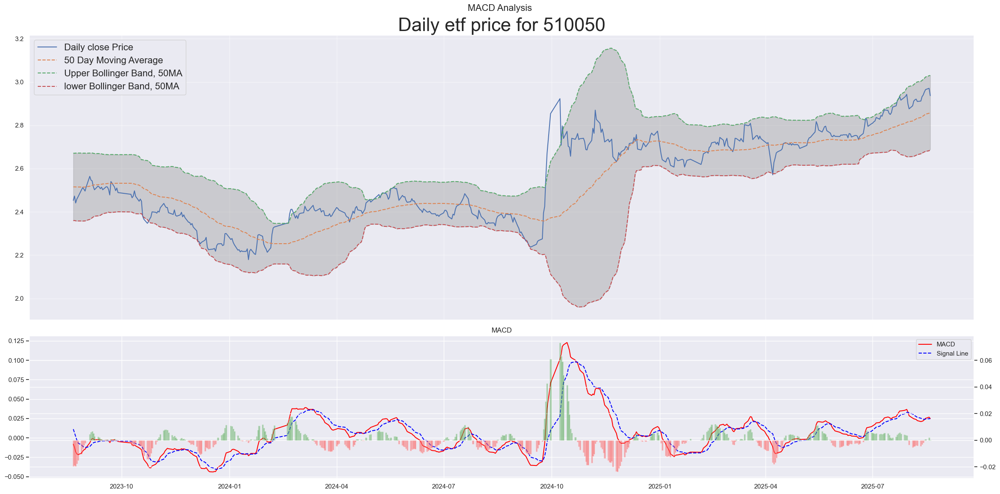

In [36]:
# 上证50
etf_code = "510050"
etf_strategy(etf_code).output()

### Test a "momentum driven" strategy

In [53]:
def backtest_momentum_strategy(price_df, initial_cash=100_000, cycle=21, window=20, sell_early=False):
    """
    Backtest the momentum strategy with X-trading-day evaluation cycle.
    Returns:
        result_df: Daily portfolio value DataFrame
        actions_df: Log of only buy/sell actions
    """
    price_df = price_df.sort_index()
    
    # cycle-day moving average
    ma = price_df.rolling(window=window).mean()
    
    # cycle-day % change
    pct_change = price_df.pct_change(cycle)
    
    # Portfolio state
    cash = initial_cash
    shares = 0
    current_stock = None
    portfolio_values = []
    actions = []

    dates = price_df.index
    
    # for i in range(cycle, len(dates)):  # start from the 22nd trading day
    for i in range(cycle, 21*13):  # Check performance for one year
        date = dates[i]
        
        # Step (1): every cycle trading days, rebalance
        if (i - cycle) % cycle == 0:
            # Sell previous stock if any
            if current_stock is not None:
                sell_price = price_df.loc[date, current_stock]
                cash += shares * sell_price
                actions.append([date, "SELL", current_stock, sell_price, shares])
                shares = 0
                current_stock = None
            
            # Find candidates above ma
            candidates = [s for s in price_df.columns 
                          if price_df.loc[date, s] > ma.loc[date, s]]
            
            if candidates:
                # Pick stock with largest cycle-day % change
                stock_changes = pct_change.loc[date, candidates]
                pick = stock_changes.idxmax()
                buy_price = price_df.loc[date, pick]
                current_stock = pick
                shares = cash // buy_price
                cash -= shares * buy_price
                actions.append([date, "BUY", pick, buy_price, shares])
        
        # Step (2): sell early if price drops below ma
        if sell_early and current_stock is not None:
            if price_df.loc[date, current_stock] < ma.loc[date, current_stock]:
                sell_price = price_df.loc[date, current_stock]
                cash += shares * sell_price
                actions.append([date, "SELL_EARLY", current_stock, sell_price, shares])
                shares = 0
                current_stock = None
        
        # Record portfolio value
        if current_stock is not None:
            value = cash + shares * price_df.loc[date, current_stock]
        else:
            value = cash
        portfolio_values.append((date, value))
    
    # Create results DataFrames
    result_df = pd.DataFrame(portfolio_values, columns=["Date", "PortfolioValue"])
    result_df.set_index("Date", inplace=True)
    
    actions_df = pd.DataFrame(actions, columns=["Date", "Action", "Stock", "Price", "Shares"])
    actions_df.set_index("Date", inplace=True)
    
    total_days = len(result_df)
    final_value = result_df["PortfolioValue"].iloc[-1]
    annualized_return = (final_value / initial_cash) ** (252 / total_days) - 1
    
    return result_df, actions_df, annualized_return


def average_annualized_return(price_df, initial_cash=100_000, n_test=100, cycle=21, window=20, sell_early=False):
    """
    Runs the strategy from different starting offsets (0-20) and averages annualized return.
    """
    returns = []
    for offset in range(n_test):  # 100 possible start offsets
        sliced_df = price_df.iloc[offset:].copy()
        if len(sliced_df) < 42:  # ensure enough data for lookback + holding
            continue
        _, _, ann_return = backtest_momentum_strategy(sliced_df, initial_cash, cycle=cycle, window=window, sell_early=sell_early)
        returns.append(ann_return)
    print(f"Average return: {np.mean(returns) if returns else np.nan}")
    print(f"Return STD: {np.std(returns) if returns else np.nan}")

    return returns

In [44]:
etf_list = [
"516570",
"512820",
"512260",
"512480",
"512580",
"159948",
"562500",
"159819",
"512600",
"560880",
"512400",
# "159697", # history too short
"515880",
"516080",
"159647",
"515220",
"512890",
"512980",
"159940",
"516110",
"513260",
"513060",
"513660",
# "159545", # history too short
"510050",
]
etf_code = etf_list[0]

df_all = ak.fund_etf_hist_em(
            symbol=etf_code.upper(),
            start_date=(datetime.today() - relativedelta(years=5)).strftime('%Y%m%d'),
            end_date=datetime.today().strftime('%Y%m%d'),
            period='daily',  # Default to daily,
            adjust='qfq'
)
df_all = df_all[['日期','收盘']].set_index('日期')
df_all = df_all.rename(columns={'收盘': etf_code})
for etf_code in etf_list[1:]:
    df = ak.fund_etf_hist_em(
            symbol=etf_code.upper(),
            start_date=(datetime.today() - relativedelta(years=5)).strftime('%Y%m%d'),
            end_date=datetime.today().strftime('%Y%m%d'),
            period='daily',  # Default to daily,
            adjust='qfq'
    )[['日期','收盘']].set_index('日期')
    df = df.rename(columns={'收盘': etf_code})
    df_all = pd.merge(df_all, df, left_index=True, right_index=True, how='inner')
df_all

ConnectTimeout: HTTPSConnectionPool(host='push2his.eastmoney.com', port=443): Max retries exceeded with url: /api/qt/stock/kline/get?fields1=f1%2Cf2%2Cf3%2Cf4%2Cf5%2Cf6&fields2=f51%2Cf52%2Cf53%2Cf54%2Cf55%2Cf56%2Cf57%2Cf58%2Cf59%2Cf60%2Cf61%2Cf116&ut=7eea3edcaed734bea9cbfc24409ed989&klt=101&fqt=1&beg=20200819&end=20250819&secid=1.516570 (Caused by ConnectTimeoutError(<urllib3.connection.HTTPSConnection object at 0x15162bd10>, 'Connection to push2his.eastmoney.com timed out. (connect timeout=15)'))

In [54]:
returns = average_annualized_return(df_all, initial_cash=100000, cycle=21, window=50)

Average return: 0.002666469700000025
Return STD: 0.22948150017367788


In [55]:
returns = average_annualized_return(df_all, initial_cash=100000, cycle=21, window=20)

Average return: 0.087105991
Return STD: 0.2999394350202828


In [59]:
returns = average_annualized_return(df_all, initial_cash=100000, cycle=21, window=20)

Average return: 0.087105991
Return STD: 0.2999394350202828


In [56]:
result_df, actions_df, annualized_return = backtest_momentum_strategy(df_all, cycle=21, window=20)
print(annualized_return)
result_df

0.020996969999999227


,PortfolioValue
Date,
2022-10-19,100000.000
2022-10-20,99402.988
2022-10-21,99701.494
2022-10-24,96417.928
2022-10-25,94925.398
...,...
2023-10-27,102799.690
2023-10-30,101699.701
2023-10-31,102899.689


In [48]:
actions_df

,Action,Stock,Price,Shares
Date,,,,
2022-10-19,BUY,516080,0.670,149253.0
2022-11-17,SELL,516080,0.718,149253.0
2022-11-17,BUY,513060,0.573,187022.0
2022-12-16,SELL,513060,0.597,187022.0
2022-12-16,BUY,513260,1.050,106335.0
2023-01-17,SELL,513260,1.085,106335.0
2023-01-17,BUY,516080,0.753,153219.0
2023-02-22,SELL,516080,0.722,153219.0
2023-02-22,BUY,159819,0.807,137081.0
